# Trash object localization with TACO dataset and retinaNet

This is the first notebook of this toy project.  
My goal for this project is to learn how to train CV models and curate CV datasets.  
The dataset used is the [TACO dataset](https://github.com/pedropro/TACO).  
This notebook is a modified version of this [notebook template](https://www.kaggle.com/code/edizaguirre/plant-object-detection).  
The model used is a retinaNet with a YOLOv8_xs pretrained on the coco dataset.  

### Downloads and Imports

In [1]:
# Install KerasCV and PyCOCOTools metrics
! pip install -q pycocotools git+https://github.com/keras-team/keras-cv@v0.6.4

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
print("tensorflow:", tf.__version__)
import keras_cv
from keras_cv import bounding_box
from keras_cv import visualization
from keras.callbacks import LambdaCallback
from tensorflow.keras.models import Model

print("keras_cv:", keras_cv.__version__)
device_name = tf.test.gpu_device_name()

if "GPU" in device_name:
    print('Found GPU at: {}'.format(device_name))
else:
    print('GPU not found.')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


tensorflow: 2.13.0
Using TensorFlow backend
keras_cv: 0.6.4
Found GPU at: /device:GPU:0


# Utils

In [3]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )

def visualize_detections(model, dataset, bounding_box_format, rows=2, cols=2):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=rows,
        cols=cols,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )
    
def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )

In [4]:
class_mapping = {
    1: "Aluminium foil",
    2: "Bottle",
    3: "Bottle cap",
    4: "Broken glass",
    5: "Can",
    6: "Carton",
    7: "Cigarette",
    8: "Cup",
    9: "Lid",
    10: "Other litter",
    11: "Other plastic",
    12: "Paper",
    13: "Plastic bag - wrapper",
    14: "Plastic container",
    15: "Pop tab",
    16: "Straw",
    17: "Styrofoam piece",
    18: "Unlabeled litter",
}

### Loading and preprocessing data

In [5]:
train_tfrecord_file = '/kaggle/input/taco-tfrecord/Train_litter.tfrecord'
val_tfrecord_file = '/kaggle/input/taco-tfrecord/Test_litter.tfrecord'

# Create a TFRecordDataset
train_dataset = tf.data.TFRecordDataset([train_tfrecord_file])
val_dataset = tf.data.TFRecordDataset([val_tfrecord_file])

In [6]:
def parse_tfrecord_fn(example):
    feature_description = {
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'image/height': tf.io.FixedLenFeature([], tf.int64),
        'image/width': tf.io.FixedLenFeature([], tf.int64),
        'image/object/bbox/xmin': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/xmax': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymin': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymax': tf.io.VarLenFeature(tf.float32),
        'image/object/class/label': tf.io.VarLenFeature(tf.int64),
    }
    
    parsed_example = tf.io.parse_single_example(example, feature_description)

    # Decode the JPEG image and normalize the pixel values to the [0, 1] range.
    img = tf.image.decode_jpeg(parsed_example['image/encoded'], channels=3) # Returned as uint8
    # Normalize the pixel values to [0, 256]
    img = tf.image.convert_image_dtype(img, tf.uint8)

    # Get the bounding box coordinates and class labels.
    xmin = tf.sparse.to_dense(parsed_example['image/object/bbox/xmin'])
    xmax = tf.sparse.to_dense(parsed_example['image/object/bbox/xmax'])
    ymin = tf.sparse.to_dense(parsed_example['image/object/bbox/ymin'])
    ymax = tf.sparse.to_dense(parsed_example['image/object/bbox/ymax'])
    labels = tf.sparse.to_dense(parsed_example['image/object/class/label'])

    # Stack the bounding box coordinates to create a [num_boxes, 4] tensor.
    rel_boxes = tf.stack([xmin, ymin, xmax, ymax], axis=-1)
    boxes = keras_cv.bounding_box.convert_format(rel_boxes, source='rel_xyxy', target='xyxy', images=img)

    # Create the final dictionary.
    image_dataset = {
        'images': img,
        'bounding_boxes': {
            'classes': labels,
            'boxes': boxes
        }
    }

    return image_dataset

train_dataset = train_dataset.map(parse_tfrecord_fn)
val_dataset = val_dataset.map(parse_tfrecord_fn)

In [7]:
# Batching
BATCH_SIZE = 32
# Adding autotune for pre-fetching
AUTOTUNE = tf.data.experimental.AUTOTUNE
# Other constants
NUM_ROWS = 4
NUM_COLS = 8
IMG_SIZE = 416
BBOX_FORMAT = "xyxy"

train_dataset = train_dataset.ragged_batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.ragged_batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

augmenter = keras.Sequential(
    [
        keras_cv.layers.JitteredResize(
            target_size=(IMG_SIZE, IMG_SIZE), scale_factor=(0.8, 1.25), bounding_box_format=BBOX_FORMAT
        ),
        keras_cv.layers.RandomFlip(mode="horizontal_and_vertical", bounding_box_format=BBOX_FORMAT),
        keras_cv.layers.RandomRotation(factor=0.25, bounding_box_format=BBOX_FORMAT),
        keras_cv.layers.RandomSaturation(factor=(0.4, 0.6)),
        keras_cv.layers.RandomHue(factor=0.2, value_range=[0,255])
    ]
)

train_dataset = train_dataset.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

# Resize and pad images
inference_resizing = keras_cv.layers.Resizing(
    IMG_SIZE, IMG_SIZE, pad_to_aspect_ratio=True, bounding_box_format=BBOX_FORMAT
)

val_dataset = val_dataset.map(inference_resizing, num_parallel_calls=tf.data.AUTOTUNE)

In [8]:
train_dataset = train_dataset.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)

### Creating RetinaNet Model

In [9]:
base_lr = 0.0001
# including a global_clipnorm is extremely important in object detection tasks
optimizer_Adam = tf.keras.optimizers.Adam(
    learning_rate=base_lr,
    global_clipnorm=10.0
)

coco_metrics = keras_cv.metrics.BoxCOCOMetrics(
    bounding_box_format=BBOX_FORMAT, evaluate_freq=5
)

class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if (epoch+1)%5==0:
            visualize_detections(
                self.model, bounding_box_format=BBOX_FORMAT, dataset=val_dataset, rows=NUM_ROWS, cols=NUM_COLS
            )

checkpoint_path="best-custom-model.h5"

callbacks_list = [
    # Conducting early stopping to stop after 6 epochs of non-improving validation loss
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=6,
    ),
    
    # Saving the best model
    keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        monitor="val_loss",
        mode="min",
        save_best_only=True,
        save_weights_only=False,
        save_freq='epoch',
    ),
    
    # Custom metrics printing after each epoch
    tf.keras.callbacks.LambdaCallback(
    on_epoch_end=lambda epoch, logs: 
        print(f"\nEpoch #{epoch+1} \n" +
              f"Loss: {logs['loss']:.4f} \n" + 
              f"mAP: {logs['MaP']:.4f} \n" + 
              f"Validation Loss: {logs['val_loss']:.4f} \n" + 
              f"Validation mAP: {logs['val_MaP']:.4f} \n") 
    ),
    
    # Visualizing results after each n epoch
    VisualizeDetections()
]

# Building a RetinaNet model with a backbone trained on resnet50
def create_model():        
    #back_bone_model = MobileNetV3Small(include_top=False, weights='imagenet')
    model = keras_cv.models.RetinaNet.from_preset(
        #"yolo_v8_m_backbone_coco",
        #"mobilenet_v3_small_imagenet",
        "yolo_v8_xs_backbone_coco",
        num_classes=len(class_mapping),
        bounding_box_format=BBOX_FORMAT
    )
    return model

model = create_model()


# Customizing non-max supression of model prediction.
model.prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format = BBOX_FORMAT,
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.5,
)

# Using focal classification loss and smoothl1 box loss with coco metrics
model.compile(
    classification_loss="focal",
    box_loss="smoothl1",
    optimizer=optimizer_Adam,
    #metrics=[coco_metrics]
)

5347160/5347160 [==============================] - 1s 0us/step


In [10]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=60,
    #callbacks=callbacks_list,
    verbose=1,
)

Epoch 1/60
132/132 [==============================] - 181s 1s/step - loss: 1.1131 - box_loss: 0.4442 - classification_loss: 0.6689 - percent_boxes_matched_with_anchor: 0.9105 - val_loss: 1.0577 - val_box_loss: 0.4619 - val_classification_loss: 0.5958 - val_percent_boxes_matched_with_anchor: 0.8881
Epoch 2/60
132/132 [==============================] - 141s 1s/step - loss: 0.8530 - box_loss: 0.3235 - classification_loss: 0.5294 - percent_boxes_matched_with_anchor: 0.9104 - val_loss: 0.9544 - val_box_loss: 0.4082 - val_classification_loss: 0.5463 - val_percent_boxes_matched_with_anchor: 0.8881
Epoch 3/60
132/132 [==============================] - 144s 1s/step - loss: 0.7877 - box_loss: 0.2933 - classification_loss: 0.4944 - percent_boxes_matched_with_anchor: 0.9102 - val_loss: 0.8909 - val_box_loss: 0.3641 - val_classification_loss: 0.5268 - val_percent_boxes_matched_with_anchor: 0.8881
Epoch 4/60
132/132 [==============================] - 144s 1s/step - loss: 0.7412 - box_loss: 0.2745 - 

### Testing the model

1/1 [==============================] - 3s 3s/step


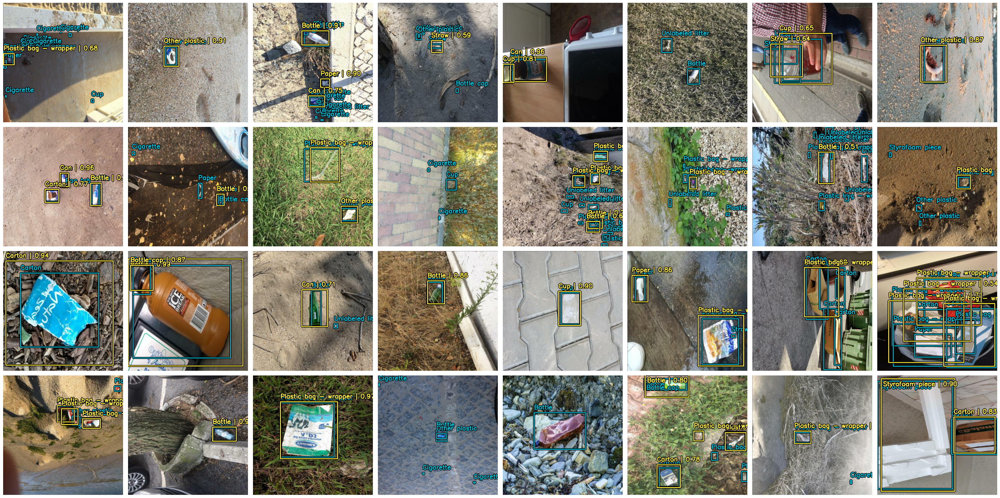

In [11]:
visualize_detections(model, dataset=val_dataset.skip(1), bounding_box_format=BBOX_FORMAT, rows=NUM_ROWS, cols=NUM_COLS)

In [12]:
for i in range(len(model.weights)):
    model.weights[i]._handle_name = model.weights[i].name + "_" + str(i)

model.save_weights("best-custom-model.h5")